# 1. docdist1

In [ ]:
# docdist1.py - initial version of document distance

# Original version by Ronald L. Rivest on February 14, 2007 Revision by Erik D. Demaine on September 12, 2011
#
# Usage:
#    docdist1.py filename1 filename2
#     
# This program computes the "distance" between two text files as the angle between their word frequency vectors (in radians).
#
# For each input file, a word-frequency vector is computed as follows:
#    (1) the specified file is read in
#    (2) it is converted into a list of alphanumeric "words". Here a "word" is a sequence of consecutive alphanumeric characters.
#        Non-alphanumeric characters are treated as blanks. Case is not significant.
#    (3) for each word, its frequency of occurrence is determined
#    (4) the word/frequency lists are sorted into order alphabetically
#
# The "distance" between two vectors is the angle between them.
# If x = (x1, x2, ..., xn) is the first vector (xi = freq of word i) and y = (y1, y2, ..., yn) is the second vector, then the 
# angle between them is defined as:
#    d(x,y) = arccos(inner_product(x,y) / (norm(x)*norm(y)))
# where:
#    inner_product(x,y) = x1*y1 + x2*y2 + ... xn*yn
#    norm(x) = sqrt(inner_product(x,x))

import math
    # math.acos(x) is the arccosine of x.
    # math.sqrt(x) is the square root of x.

import sys

##################################
# Operation 1: read a text file ##
##################################
def read_file(filename):
    """ 
    Read the text file with the given filename; return a list of the lines of text in the file.
    """
    try:
        f = open(filename, 'r')
        return f.readlines()
    except IOError:
        print ("Error opening or reading input file: ",filename)
        sys.exit()

#################################################
# Operation 2: split the text lines into words ##
#################################################
def get_words_from_line_list(L):
    """
    Parse the given list L of text lines into words. Return list of all words found.
    """

    word_list = []
    for line in L:
        words_in_line = get_words_from_string(line)
        word_list = word_list + words_in_line
    return word_list

def get_words_from_string(line):
    """
    Return a list of the words in the given input string, converting each word to lower-case.

    Input:  line (a string)
    Output: a list of strings (each string is a sequence of alphanumeric characters)
    """
    word_list = []          # accumulates words in line
    character_list = []     # accumulates characters in word
    for c in line:
        if c.isalnum():
            character_list.append(c)
        elif len(character_list)>0:
            word = "".join(character_list)
            word = word.lower()
            word_list.append(word)
            character_list = []
    if len(character_list)>0:
        word = "".join(character_list)
        word = word.lower()
        word_list.append(word)
    return word_list

##############################################
# Operation 3: count frequency of each word ##
##############################################
def count_frequency(word_list):
    """
    Return a list giving pairs of form: (word,frequency)
    """
    L = []
    for new_word in word_list:
        for entry in L:
            if new_word == entry[0]:
                entry[1] = entry[1] + 1
                break
        else:
            L.append([new_word,1])
    return L

###############################################################
# Operation 4: sort words into alphabetic order             ###
###############################################################
def insertion_sort(A):
    """
    Sort list A into order, in place.

    From Cormen/Leiserson/Rivest/Stein, Introduction to Algorithms (second edition), page 17, modified to adjust for fact that 
    Python arrays use 0-indexing.
    """
    for j in range(len(A)):
        key = A[j]
        # insert A[j] into sorted sequence A[0..j-1]
        i = j-1
        while i>-1 and A[i]>key:
            A[i+1] = A[i]
            i = i-1
        A[i+1] = key
    return A
    
#############################################
## compute word frequencies for input file ##
#############################################
def word_frequencies_for_file(filename):
    """
    Return alphabetically sorted list of (word,frequency) pairs for the given file.
    """

    line_list = read_file(filename)
    word_list = get_words_from_line_list(line_list)
    freq_mapping = count_frequency(word_list)
    insertion_sort(freq_mapping)

    print ("File",filename,":",)
    print (len(line_list),"lines,",)
    print (len(word_list),"words,",)
    print (len(freq_mapping),"distinct words")

    return freq_mapping

def inner_product(L1,L2):
    """
    Inner product between two vectors, where vectors are represented as lists of (word,freq) pairs.

    Example: inner_product([["and",3],["of",2],["the",5]],
                           [["and",4],["in",1],["of",1],["this",2]]) = 14.0 
    """
    sum = 0.0
    for word1, count1 in L1:
        for word2, count2 in L2:
            if word1 == word2:
                sum += count1 * count2
    return sum

def vector_angle(L1,L2):
    """
    The input is a list of (word,freq) pairs, sorted alphabetically. Return the angle between these two vectors.
    """
    numerator = inner_product(L1,L2)
    denominator = math.sqrt(inner_product(L1,L1)*inner_product(L2,L2))
    return math.acos(numerator/denominator)

def main():
    if len(sys.argv) != 3:
        print ("Usage: docdist1.py filename_1 filename_2")
    else:
        filename_1 = sys.argv[1]
        filename_2 = sys.argv[2]
        sorted_word_list_1 = word_frequencies_for_file(filename_1)
        sorted_word_list_2 = word_frequencies_for_file(filename_2)
        distance = vector_angle(sorted_word_list_1,sorted_word_list_2)
        print ("The distance between the documents is: %0.6f (radians)"%distance)

if __name__ == "__main__":
    import profile
    profile.run("main()")


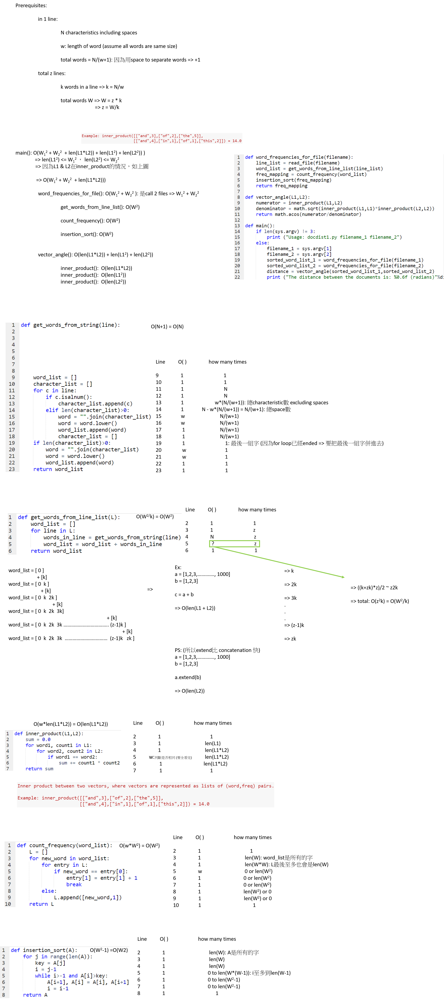

In [2]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist1.png")

# 2. docdist2

In [ ]:
"""changed concatenate to extend in get_words_from_line_list，其餘都與docdist1相同"""

def get_words_from_line_list(L):     # docdist1
    """
    Parse the given list L of text lines into words. Return list of all words found.
    """
    word_list = []
    for line in L:
        words_in_line = get_words_from_string(line)
        word_list = word_list + words_in_line
    return word_list

def get_words_from_line_list(L):     # docdist2
    """
    Parse the given list L of text lines into words. Return list of all words found.
    """
    word_list = []
    for line in L:
        words_in_line = get_words_from_string(line)
        # Using "extend" is much more efficient than concatenation here:
        word_list.extend(words_in_line)
    return word_list

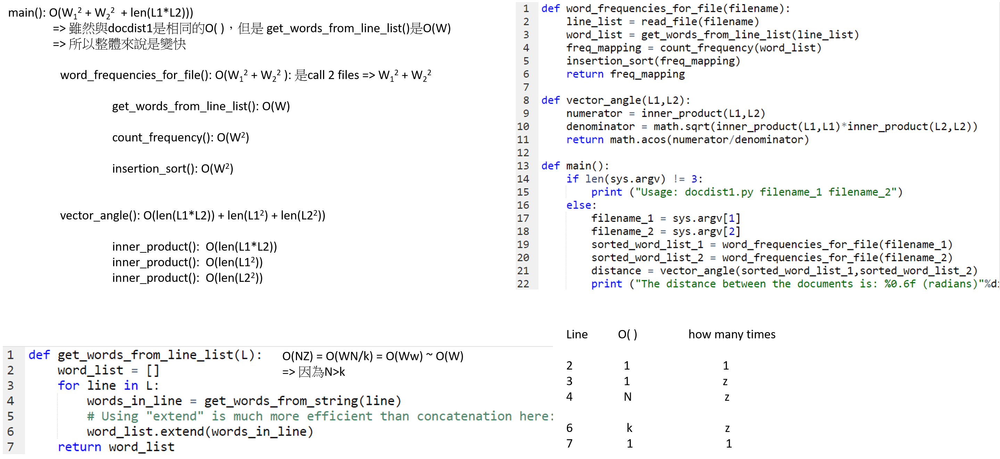

In [15]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist2.png")

# 3. docdist3

In [ ]:
"""improved inner_product to exploit sorted order and achieve linear instead of quadratic time，其餘都與docdist2相同"""

def inner_product(L1,L2):                 # docdist2
    """
    Inner product between two vectors, where vectors are represented as lists of (word,freq) pairs.

    Example: inner_product([["and",3],["of",2],["the",5]],
                           [["and",4],["in",1],["of",1],["this",2]]) = 14.0 
    """
    sum = 0.0
    for word1, count1 in L1:
        for word2, count2 in L2:
            if word1 == word2:
                sum += count1 * count2
    return sum






def inner_product(L1,L2):                 # docdist3
    """
    Inner product between two vectors, where vectors are represented as alphabetically sorted (word,freq) pairs.

    Example: inner_product([["and",3],["of",2],["the",5]],
                           [["and",4],["in",1],["of",1],["this",2]]) = 14.0 
    """
    sum = 0.0
    i = 0
    j = 0
    while i<len(L1) and j<len(L2):
        # L1[i:] and L2[j:] yet to be processed
        if L1[i][0] == L2[j][0]:
            # both vectors have this word
            sum += L1[i][1] * L2[j][1]
            i += 1
            j += 1
        elif L1[i][0] < L2[j][0]:                   # 可以用 "大小" 比較L1 & L2的elements
                                                    # => 是因為在word_frequencies_for_file()中，就已經用insertion_sort()將list排序過
            # word L1[i][0] is in L1 but not L2
            i += 1
        else:
            # word L2[j][0] is in L2 but not L1
            j += 1
    return sum

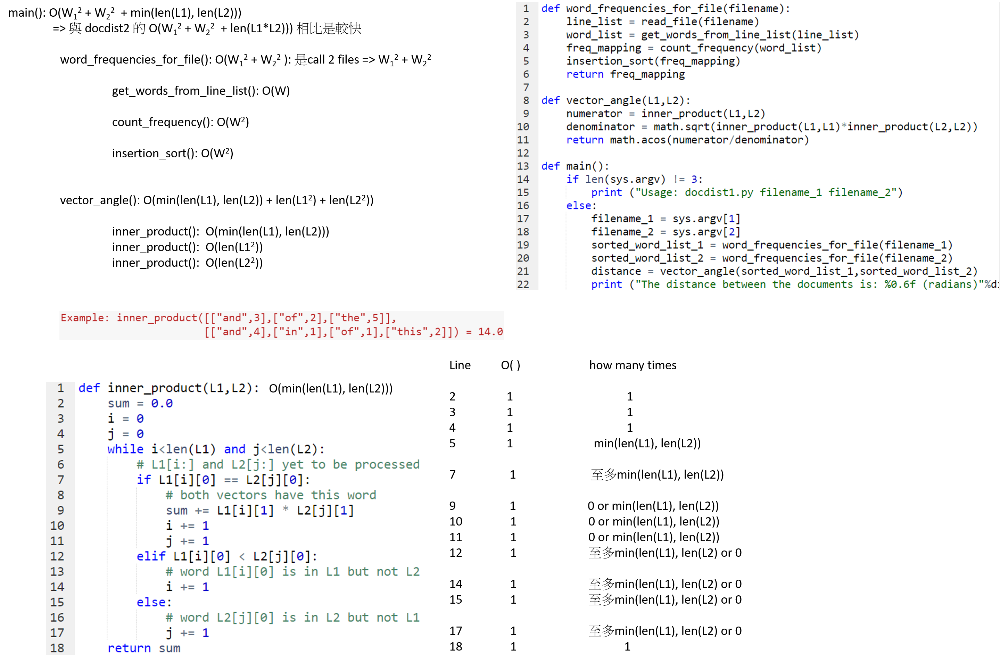

In [18]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist3.png")

# 4. docdist4

In [ ]:
"""changed count_frequency to use dictionaries instead of lists，其餘都與docdist3相同"""

def count_frequency(word_list):                    # docdist3
    """
    Return a list giving pairs of form: (word,frequency)
    """
    L = []
    for new_word in word_list:
        for entry in L:
            if new_word == entry[0]:
                entry[1] = entry[1] + 1
                break
        else:
            L.append([new_word,1])
    return L






def count_frequency(word_list):                    # docdist4
    D = {}
    for new_word in word_list:
        if new_word in D:
            D[new_word] = D[new_word]+1
        else:
            D[new_word] = 1
    return D.items()

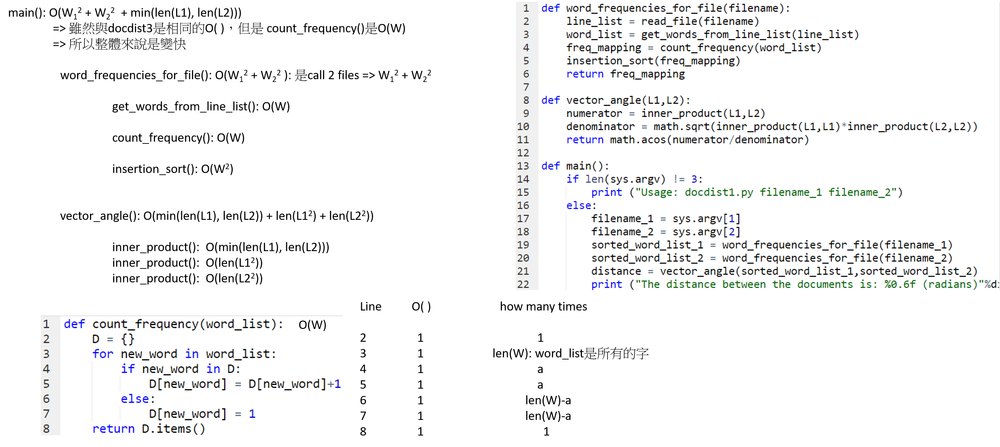

In [9]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist4.png")

# 5. docdist5

In [ ]:
"""change get_words_from_string to use string translate and split，其餘都與docdist4相同"""

def get_words_from_string(line):                    # docdist4
    """
    Return a list of the words in the given input string, converting each word to lower-case.

    Input:  line (a string)
    Output: a list of strings (each string is a sequence of alphanumeric characters)
    """
    word_list = []          # accumulates words in line
    character_list = []     # accumulates characters in word
    for c in line:
        if c.isalnum():
            character_list.append(c)
        elif len(character_list)>0:
            word = "".join(character_list)
            word = word.lower()
            word_list.append(word)
            character_list = []
    if len(character_list)>0:
        word = "".join(character_list)
        word = word.lower()
        word_list.append(word)
    return word_list






                                                     # docdist5    
# global variables needed for fast parsing translation table maps upper case to lower case and punctuation to spaces
translation_table = str.maketrans(string.punctuation + string.ascii_uppercase,             # "!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~" + "ABCDEFGHIJKLMNOPQRSTUVWXYZ" => 換成
                                  " "*len(string.punctuation) + string.ascii_lowercase)    # "                                " + "abcdefghijklmnopqrstuvwxyz"
                                                                                           # => 也就是沒有punctuations，punctuations全部換成spaces
                                                                                           # => upper case letters全部換成lower case letters
def get_words_from_string(line):
    """
    Return a list of the words in the given input string, converting each word to lower-case.

    Input:  line (a string)
    Output: a list of strings (each string is a sequence of alphanumeric characters)
    """
    line = line.translate(translation_table)                                               #處理目標string: line
    word_list = line.split()                                                               # split line's elements，並形成list
    return word_list


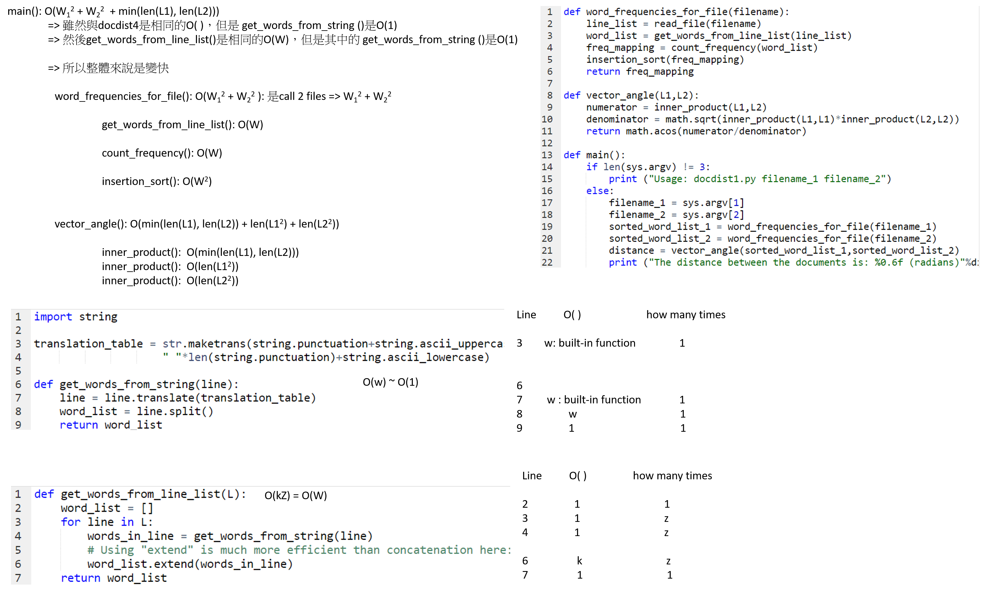

In [17]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist5.png")

# 6. docdist6
# 不會analyze recursions of Merge sort

In [ ]:
"""changed sorting from insertion sort to merge sort，其餘都與docdist5相同"""

def insertion_sort(A):                              # docdist5
    """
    Sort list A into order, in place.

    From Cormen/Leiserson/Rivest/Stein, Introduction to Algorithms (second edition), page 17, modified to adjust for fact that 
    Python arrays use 0-indexing.
    """
    for j in range(len(A)):
        key = A[j]
        # insert A[j] into sorted sequence A[0..j-1]
        i = j-1
        while i>-1 and A[i]>key:
            A[i+1] = A[i]
            i = i-1
        A[i+1] = key
    return A






def merge_sort(A):                                  # docdist6
    """
    Sort list A into order, and return result.
    """
    if len(A)==1: 
        return A
    mid = len(A)//2     # floor division
    L = merge_sort(A[:mid])
    R = merge_sort(A[mid:])
    
    i = 0
    j = 0
    answer = []
    while i<len(L) and j<len(R):
        if L[i]<R[j]:
            answer.append(L[i])
            i += 1
        else:
            answer.append(R[j])
            j += 1
    if i<len(L):
        answer.extend(L[i:])
    if j<len(R):
        answer.extend(R[j:])
    return answer


In [ ]:
Description:

average time complexity of "Insertion sort" is O(N^2)
average time complexity of "Merge sort" is O(N*log N)

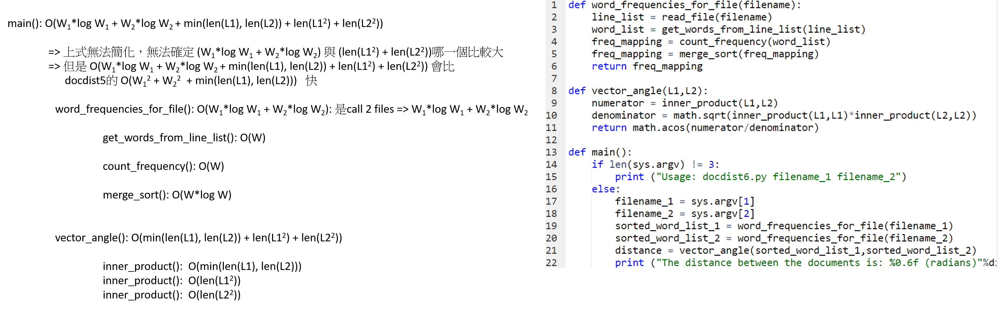

In [1]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist6.png")

# 7. docdist7

In [ ]:
"""remove sorting altogether via more hashing，其餘都與docdist6相同"""

def count_frequency(word_list):                                     # docdist6
    """
    Return a list giving pairs of form: (word,frequency)
    """
    D = {}
    for new_word in word_list:
        if new_word in D:
            D[new_word] = D[new_word]+1
        else:
            D[new_word] = 1
    return D.items()

def merge_sort(A):                                  
    """
    Sort list A into order, and return result.
    """
    if len(A)==1: 
        return A
    mid = len(A)//2                # floor division
    L = merge_sort(A[:mid])
    R = merge_sort(A[mid:])
    
    i = 0
    j = 0
    answer = []
    while i<len(L) and j<len(R):
        if L[i]<R[j]:
            answer.append(L[i])
            i += 1
        else:
            answer.append(R[j])
            j += 1
    if i<len(L):
        answer.extend(L[i:])
    if j<len(R):
        answer.extend(R[j:])
    return answer

def word_frequencies_for_file(filename):
    """
    Return alphabetically sorted list of (word,frequency) pairs 
    for the given file.
    """
    line_list = read_file(filename)
    word_list = get_words_from_line_list(line_list)
    freq_mapping = count_frequency(word_list)
    freq_mapping = merge_sort(freq_mapping)
    return freq_mapping

def inner_product(L1,L2):
    """
    Inner product between two vectors, where vectors
    are represented as alphabetically sorted (word,freq) pairs.

    Example: inner_product([["and",3],["of",2],["the",5]],
                           [["and",4],["in",1],["of",1],["this",2]]) = 14.0 
    """
    sum = 0.0
    i = 0
    j = 0
    while i<len(L1) and j<len(L2):
        # L1[i:] and L2[j:] yet to be processed
        if L1[i][0] == L2[j][0]:
            # both vectors have this word
            sum += L1[i][1] * L2[j][1]
            i += 1
            j += 1
        elif L1[i][0] < L2[j][0]:
            # word L1[i][0] is in L1 but not L2
            i += 1
        else:
            # word L2[j][0] is in L2 but not L1
            j += 1
    return sum

def vector_angle(L1,L2):
    """
    The input is a list of (word,freq) pairs, sorted alphabetically.

    Return the angle between these two vectors.
    """
    numerator = inner_product(L1,L2)
    denominator = math.sqrt(inner_product(L1,L1)*inner_product(L2,L2))
    return math.acos(numerator/denominator)






def count_frequency(word_list):                         # docdist7
    """
    Return a dictionary mapping words to frequency.
    """
    D = {}
    for new_word in word_list:
        if new_word in D:
            D[new_word] = D[new_word]+1
        else:
            D[new_word] = 1
    return D                                       #直接return "D" (直接return整個dictionary)，instead of  "D.items“
                                                   # => 所以inner_product()可以用dictionary來處理
    
def word_frequencies_for_file(filename):
    """
    Return dictionary of (word,frequency) pairs for the given file.
    """

    line_list = read_file(filename)
    word_list = get_words_from_line_list(line_list)
    freq_mapping = count_frequency(word_list)


    return freq_mapping

def inner_product(D1,D2):
    """
    Inner product between two vectors, where vectors
    are represented as dictionaries of (word,freq) pairs.

    Example: inner_product({"and":3,"of":2,"the":5},
                           {"and":4,"in":1,"of":1,"this":2}) = 14.0 
    """
    sum = 0.0
    for key in D1:
        if key in D2:
            sum += D1[key] * D2[key]
    return sum

def vector_angle(D1,D2):
    """
    The input is a list of (word,freq) pairs, sorted alphabetically.

    Return the angle between these two vectors.
    """
    numerator = inner_product(D1,D2)
    denominator = math.sqrt(inner_product(D1,D1)*inner_product(D2,D2))
    return math.acos(numerator/denominator)

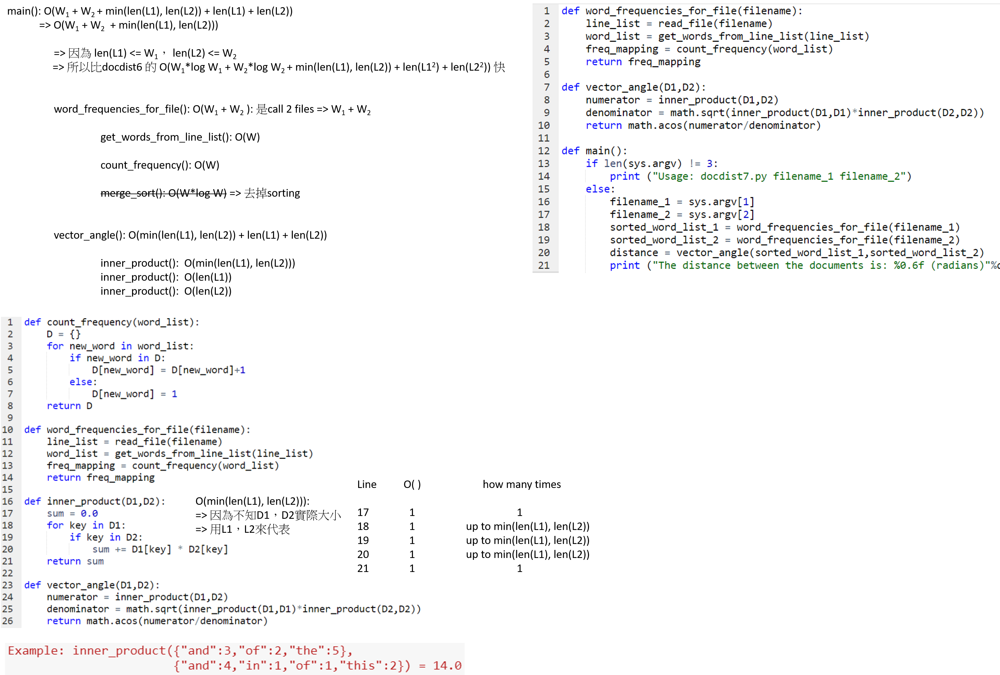

In [2]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist7.png")

# docdist8

In [ ]:
"""treat whole file as a single "line"，如Fig. 1，其餘都與docdist7相同"""

def get_words_from_line_list(L):                        # docdist7 
    """
    Parse the given list L of text lines into words. Return list of all words found.
    """
    word_list = []
    for line in L:
        words_in_line = get_words_from_string(line)
        word_list.extend(words_in_line)
    return word_list

# global variables needed for fast parsing translation table maps upper case to lower case and punctuation to spaces
translation_table = str.maketrans(string.punctuation + string.ascii_uppercase, " "*len(string.punctuation) + string.ascii_lowercase)

def get_words_from_string(line):
    """
    Return a list of the words in the given input string, converting each word to lower-case.

    Input:  line (a string)
    Output: a list of strings (each string is a sequence of alphanumeric characters)
    """
    line = line.translate(translation_table)
    word_list = line.split()
    return word_list






                                                       # docdist8 
# global variables needed for fast parsing translation table maps upper case to lower case and punctuation to spaces
translation_table = str.maketrans(string.punctuation + string.ascii_uppercase, " "*len(string.punctuation) + string.ascii_lowercase)

def get_words_from_line_list(text):
    """
    Parse the given text into words. Return list of all words found.
    """
    text = text.translate(translation_table)
    word_list = text.split()
    return word_list

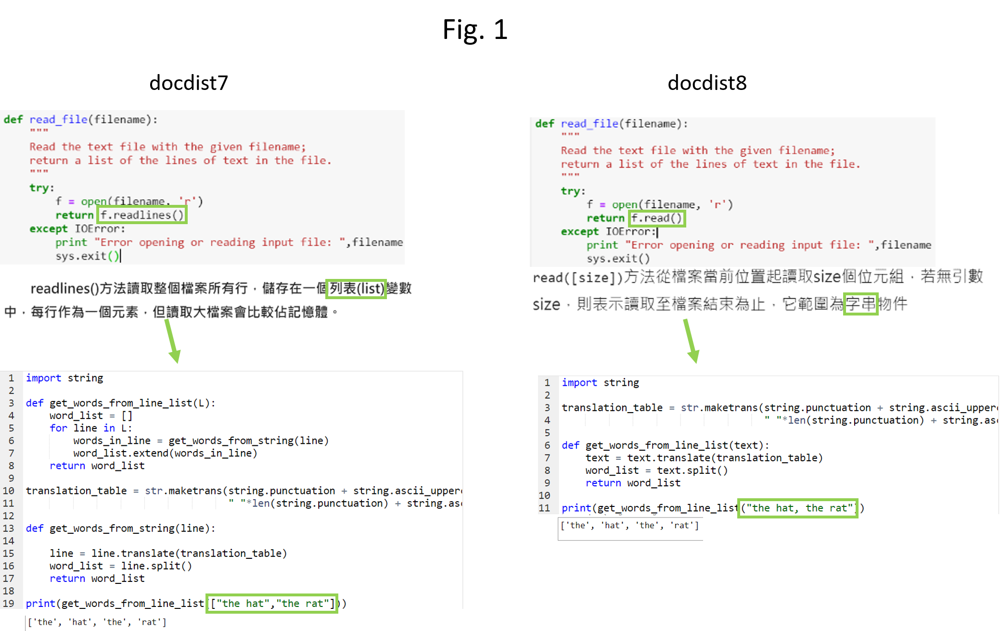

In [4]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist8_Fig. 1.png")

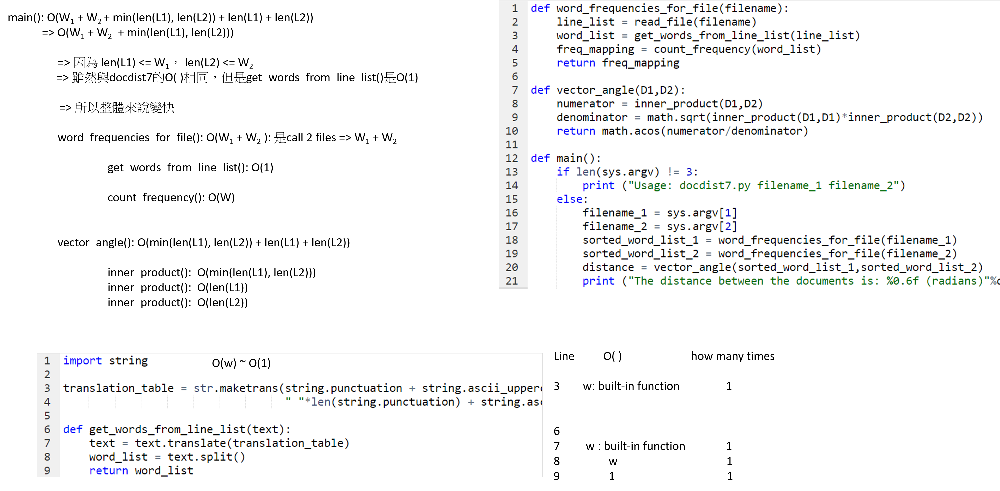

In [5]:
from IPython.display import Image

Image(r"Desktop\Unit 1_Lesson2_docdist8.png")